KB

16_V4_02

31-October-2025

Organize data to plot

1. psychometric

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns 
from functions import *
import sys
sys.path.insert(0, "/home/kceniabougrova/Documents/GitHub/ibl-photometry/src")

from one.api import ONE 
one = ONE() 

table_path = '/home/kceniabougrova/Downloads/new_sessions_Aug2025 - all_together_tab2_Oct2025.csv'
sessions_list = pd.read_csv(table_path)


i = 1000 #select the session here #DA
# i = 1626

eid, subject, date, region, nph_file_path, nph_bnc_path = select_one_session(
    sessions_list, row=i)


old_prefix = '/mnt/h0/kb/'
new_prefix = '/media/kceniabougrova/Seagate Basic/IBL_server_PC_20250529/kb/'

sessions_list

/home/kceniabougrova/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


382c9380-a2f7-411f-949d-a6df6c00747f
{'subject': 'ZFM-04019', 'date': datetime.date(2023, 1, 19), 'sequence': 1}
ZFM-04019 2023-01-19 382c9380-a2f7-411f-949d-a6df6c00747f


,Unnamed: 0,subject,date,good,detail,NM,eid,fiber,region,nph_file,nph_bnc,comment,photometry_path_a,photometry_path_b,digital_inputs_path,comment2,ttl nph,ttl behav,Unnamed: 18,Unnamed: 19
0,NaN,ZFM-03059,2021-08-23,NaN,NaN,5HT,0fa78e73-a223-4e55-a524-a839262308e6,probe01,Region1G,NaN,NaN,HCW2,/mnt/h0/kb/data/external_drive/HCW_S2_23082021...,NaN,/mnt/h0/kb/data/external_drive/HCW_S2_23082021...,"1st; I was having BNC issues here, I would use...",NaN,NaN,NaN,NaN
1,NaN,ZFM-03059,2021-08-23,NaN,NaN,5HT,0fa78e73-a223-4e55-a524-a839262308e6,probe01,Region1G,NaN,NaN,HCW2,/mnt/h0/kb/data/external_drive/HCW_S2_23082021...,NaN,nothing,"I think ignore, small and BNC issue",NaN,NaN,NaN,NaN
2,NaN,ZFM-03059,2021-08-23,NaN,NaN,5HT,0fa78e73-a223-4e55-a524-a839262308e6,probe01,Region1G,NaN,NaN,HCW2,/mnt/h0/kb/data/external_drive/HCW_S2_23082021...,NaN,/mnt/h0/kb/data/external_drive/HCW_S2_23082021...,last part,NaN,NaN,NaN,NaN
3,NaN,ZFM-03061,2021-08-23,NaN,NaN,5HT,069c0e53-dd22-4d1c-bae5-443ad2b6cd9f,probe04,Region1G,NaN,0,HCW2,/mnt/h0/kb/data/external_drive/HCW_S2_23082021...,NaN,/mnt/h0/kb/data/external_drive/HCW_S2_23082021...,NaN,NaN,NaN,NaN,NaN
4,NaN,ZFM-03061,2021-08-23,NaN,NaN,5HT,069c0e53-dd22-4d1c-bae5-443ad2b6cd9f,probe05,Region4G,NaN,0,HCW2,/mnt/h0/kb/data/external_drive/HCW_S2_23082021...,NaN,/mnt/h0/kb/data/external_drive/HCW_S2_23082021...,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1864,1032.0,ZFM-06272,2024-01-24,G,NaN,NE,69fe2bf9-e52b-4b5e-8a6d-3c3f95d25d0a,probe27,Region3G,1,1,NaN,/mnt/h0/kb/data/one/mainenlab/Subjects/ZFM-062...,NaN,/mnt/h0/kb/data/external_drive/2024-01-24/bons...,NaN,NaN,NaN,NaN,NaN
1865,1033.0,ZFM-06272,2024-01-24,G,NaN,NE,69fe2bf9-e52b-4b5e-8a6d-3c3f95d25d0a,probe28,Region6G,1,1,NaN,/mnt/h0/kb/data/one/mainenlab/Subjects/ZFM-062...,NaN,/mnt/h0/kb/data/external_drive/2024-01-24/bons...,NaN,NaN,NaN,NaN,NaN
1866,1034.0,ZFM-06275,2024-01-24,G,NaN,NE,0f4f1c75-5163-479a-b20d-5b77d5dbf9bc,probe30,Region3G,0,1,NaN,/mnt/h0/kb/data/one/mainenlab/Subjects/ZFM-062...,NaN,/mnt/h0/kb/data/external_drive/2024-01-24/bons...,NaN,NaN,NaN,NaN,NaN
1867,1035.0,ZFM-06275,2024-01-24,G,NaN,NE,0f4f1c75-5163-479a-b20d-5b77d5dbf9bc,probe31,Region6G,0,1,NaN,/mnt/h0/kb/data/one/mainenlab/Subjects/ZFM-062...,NaN,/mnt/h0/kb/data/external_drive/2024-01-24/bons...,NaN,NaN,NaN,NaN,NaN


In [2]:
# =========================================================
# CONFIG
# =========================================================
PLOT = True

processed_sessions = []
error_sessions_processing = []


# =========================================================
# LOOP THROUGH FILTERED SESSIONS
# =========================================================
start_idx = 0 

In [5]:
# # =========================================================
# # LOAD AND FILTER GOOD SESSIONS IF NEEDED
# # =========================================================
# df_all = sessions_list
# df_good = df_all[df_all["good"] == "G"].reset_index(drop=True)
# print(f"✅ Loaded {len(df_good)} good signal sessions")

# # SAVE_DIR = "/home/kceniabougrova/Downloads/good_sessions_outputs"
# # os.makedirs(SAVE_DIR, exist_ok=True)

In [25]:
# ============================================================================================
# ============================================================================================
# =========================================================
# ================== PSYCHOMETRIC CURVES ==================
# =========================================================

import os, numpy as np, pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
from scipy.stats import norm
from scipy.optimize import minimize

# =========================================================
# SETTINGS
# =========================================================
BASE_DIR = "/home/kceniabougrova/Downloads/good_sessions_outputs/"
# BASE_DIR = "/home/kceniabougrova/Documents/2025_10_31_POSTER_SfN/"
df_path = os.path.join(BASE_DIR, "df_goodSessions_highPerf.xlsx")
df_high = pd.read_excel(df_path)

# =========================================================
# HELPER FUNCTIONS
# =========================================================
def find_trials_file(base_dir, subject, date, region, eid):
    """Finds df_trials file ignoring numeric prefix."""
    for f in os.listdir(base_dir):
        if f.startswith("df_trials_") and subject in f and date in f and region in f and eid in f and f.endswith(".csv"):
            return os.path.join(base_dir, f)
    return None

def signed_contrast_x100(df):
    """Signed contrast ×100: (right - left)."""
    L = df["contrastLeft"].fillna(0).values
    R = df["contrastRight"].fillna(0).values
    return (R - L)

def stim_side(df):
    """+1 if right, -1 if left."""
    left_present  = df["contrastLeft"].notna().values
    right_present = df["contrastRight"].notna().values
    side = np.full(len(df), np.nan)
    side[(right_present) & (~left_present)] = +1
    side[(left_present) & (~right_present)] = -1
    return side

def session_prob_right_by_contrast(df):
    """Returns signed contrast (xc) and P(choice right) per contrast."""
    s = stim_side(df)
    fb = df["feedbackType"].values
    valid = (~np.isnan(s)) & np.isin(fb, [+1, -1])
    if not np.any(valid):
        return np.array([]), np.array([])

    sc = signed_contrast_x100(df)
    sc_v, s_v, fb_v = sc[valid], s[valid], fb[valid]
    chose_right = (fb_v * s_v) == +1

    xc = np.sort(np.unique(np.round(sc_v, 2)))
    pc = np.empty_like(xc, dtype=float)
    for i, c in enumerate(xc):
        m = np.isclose(sc_v, c, atol=1e-6)
        pc[i] = np.mean(chose_right[m]) if np.any(m) else np.nan
    return xc, pc

def interpolate_to_grid(xc, pc, xgrid):
    """Interpolate session data to common grid."""
    ok = ~np.isnan(pc)
    if np.sum(ok) < 2:
        return np.full_like(xgrid, np.nan)
    order = np.argsort(xc[ok])
    return np.interp(xgrid, xc[ok][order], pc[ok][order], left=np.nan, right=np.nan)

def smooth_curve(y, window=21, poly=3):
    """Apply Savitzky–Golay smoothing."""
    y2 = y.copy()
    ok = ~np.isnan(y2)
    if np.sum(ok) < window:
        return y2
    y2[ok] = savgol_filter(y2[ok], window_length=window, polyorder=poly)
    return y2

# ---- IBL-style psychometric fit ----
def psychometric_function(x, mu, sigma, gamma, lam):
    """Cumulative Gaussian psychometric function."""
    return gamma + (1 - gamma - lam) * norm.cdf(x, loc=mu, scale=sigma)

def fit_psychometric(x, y):
    """Maximum-likelihood fit of cumulative Gaussian to averaged curve."""
    x, y = np.asarray(x), np.asarray(y)
    ok = ~np.isnan(y)
    if np.sum(ok) < 4:
        return (np.nan, np.nan, np.nan, np.nan)
    x, y = x[ok], y[ok]
    y = np.clip(y, 1e-4, 1 - 1e-4)

    def nll(params):
        mu, sigma, gamma, lam = params
        if sigma <= 0 or gamma < 0 or lam < 0 or gamma + lam >= 1:
            return np.inf
        p = psychometric_function(x, mu, sigma, gamma, lam)
        return -np.sum(y * np.log(p) + (1 - y) * np.log(1 - p))

    init   = [0, 0.3, 0.05, 0.05]
    bounds = [(-1, 1), (1e-3, 5), (0, 0.4), (0, 0.4)]
    res = minimize(nll, init, bounds=bounds)
    return res.x if res.success else (np.nan, np.nan, np.nan, np.nan)

MICE = {
    "DA":   ["ZFM-03447","ZFM-03448","ZFM-04026","ZFM-04019","ZFM-04022"],
    "5-HT": ["ZFM-03061","ZFM-03065","ZFM-03059","ZFM-03062","ZFM-04392","ZFM-05236","ZFM-05248","ZFM-05245","ZFM-05235"],
    "NE":   ["ZFM-04533","ZFM-04534","ZFM-06271","ZFM-06272","ZFM-06171","ZFM-06268","ZFM-06275"],
    "ACh":  ["ZFM-06305","ZFM-06946","ZFM-06948"],
}

PALETTE = {
    "DA":   "#D44836",
    "5-HT": "#7F4CC8",
    "NE":   "#2E84CC",
    "ACh":  "#45B437",
}


# OUT_DIR = os.path.join(BASE_DIR, "00_psychometric_SfN")
os.makedirs(OUT_DIR, exist_ok=True) 



In [28]:
MICE = {
    "DA":   ["ZFM-03447","ZFM-03448","ZFM-04026","ZFM-04019","ZFM-04022"],
    "5-HT": ["ZFM-03061","ZFM-03065","ZFM-03059","ZFM-03062","ZFM-04392","ZFM-05236","ZFM-05248","ZFM-05245","ZFM-05235"],
    "NE":   ["ZFM-04533","ZFM-04534","ZFM-06271","ZFM-06272","ZFM-06171","ZFM-06268","ZFM-06275"],
    "ACh":  ["ZFM-06305","ZFM-06946","ZFM-06948"],
}

PALETTE = {
    "DA":   "#D44836",
    "5-HT": "#7F4CC8",
    "NE":   "#2E84CC",
    "ACh":  "#45B437",
}

df_high = df_all

<ipython-input-25-8168b0891197>:101: RuntimeWarning: divide by zero encountered in log
  return -np.sum(y * np.log(p) + (1 - y) * np.log(1 - p))
/home/kceniabougrova/.local/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


✅ DA: μ=0.205, σ=1.220, γ=0.000, λ=0.158


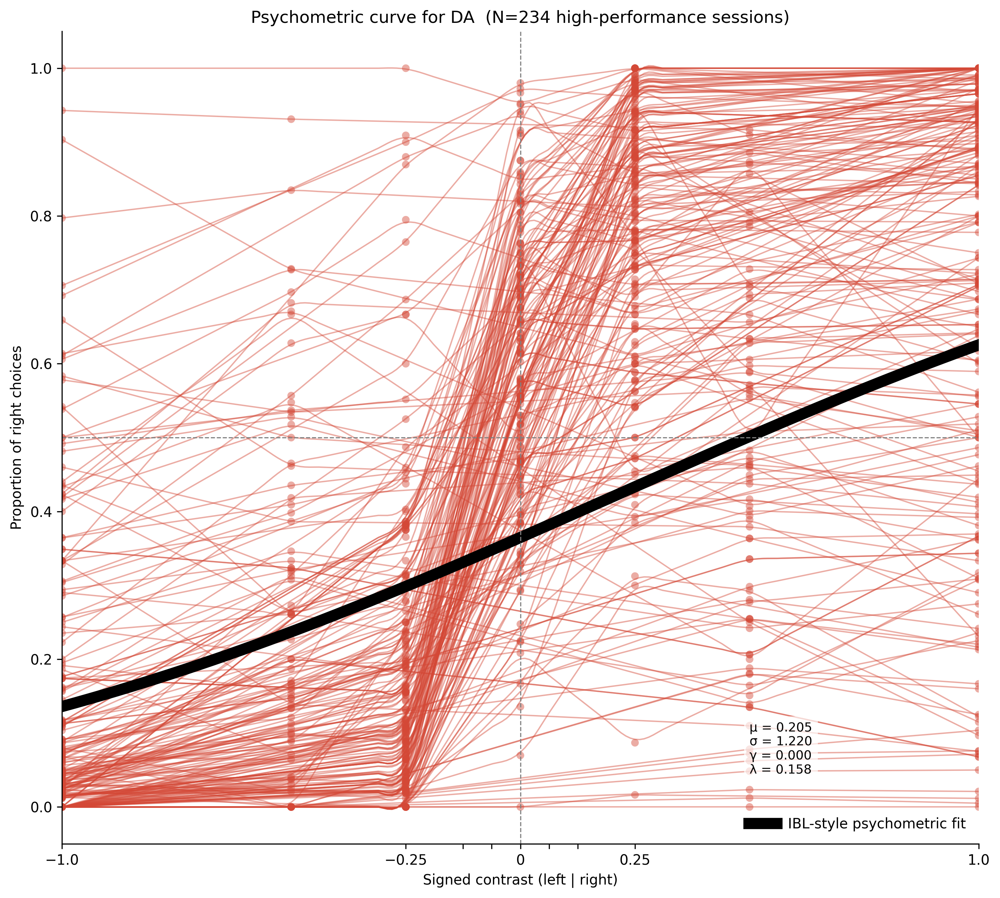

✅ 5-HT: μ=-0.034, σ=0.234, γ=0.154, λ=0.201


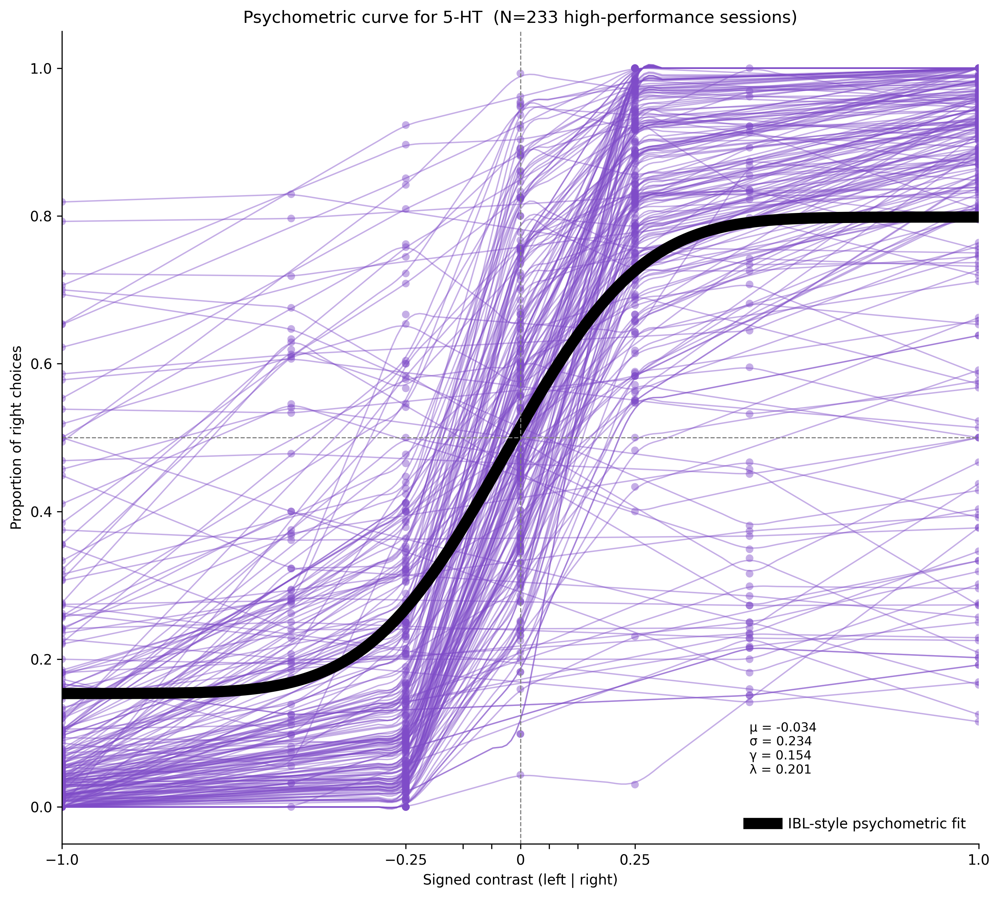

<ipython-input-25-8168b0891197>:101: RuntimeWarning: divide by zero encountered in log
  return -np.sum(y * np.log(p) + (1 - y) * np.log(1 - p))
/home/kceniabougrova/.local/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


✅ NE: μ=0.225, σ=2.271, γ=0.000, λ=0.000


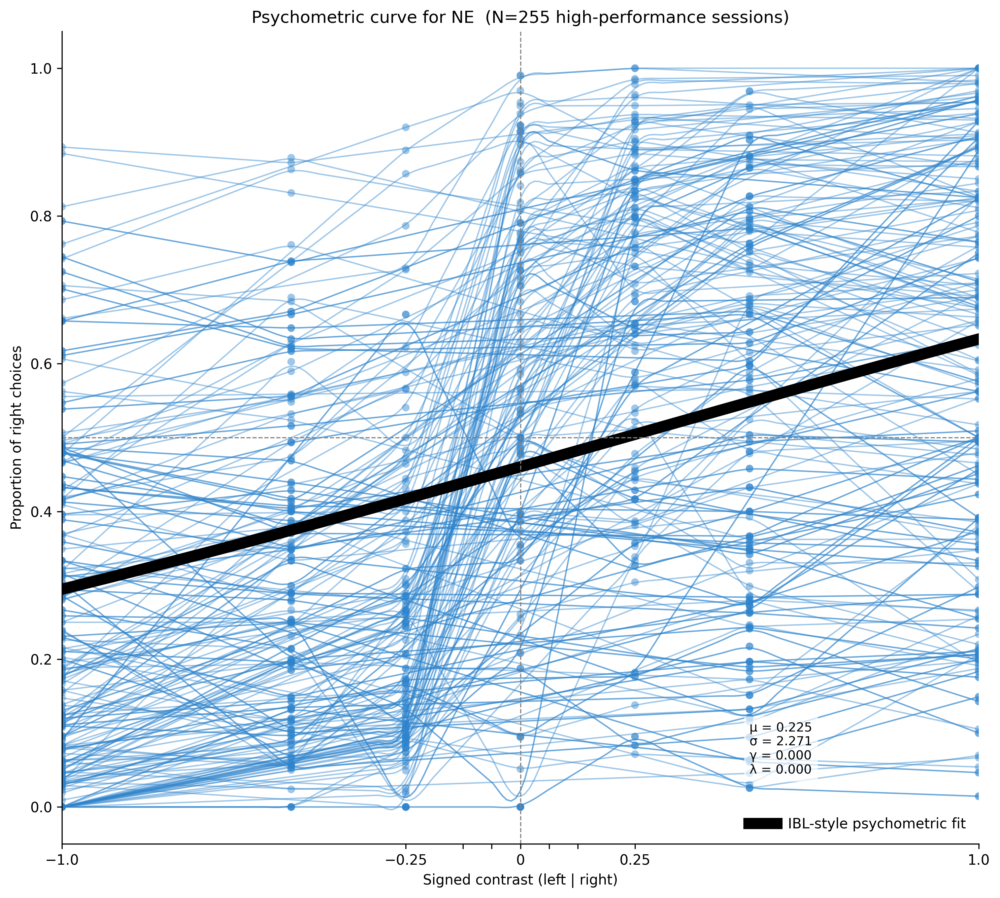

<ipython-input-25-8168b0891197>:101: RuntimeWarning: divide by zero encountered in log
  return -np.sum(y * np.log(p) + (1 - y) * np.log(1 - p))
/home/kceniabougrova/.local/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


✅ ACh: μ=0.197, σ=1.546, γ=0.000, λ=0.000


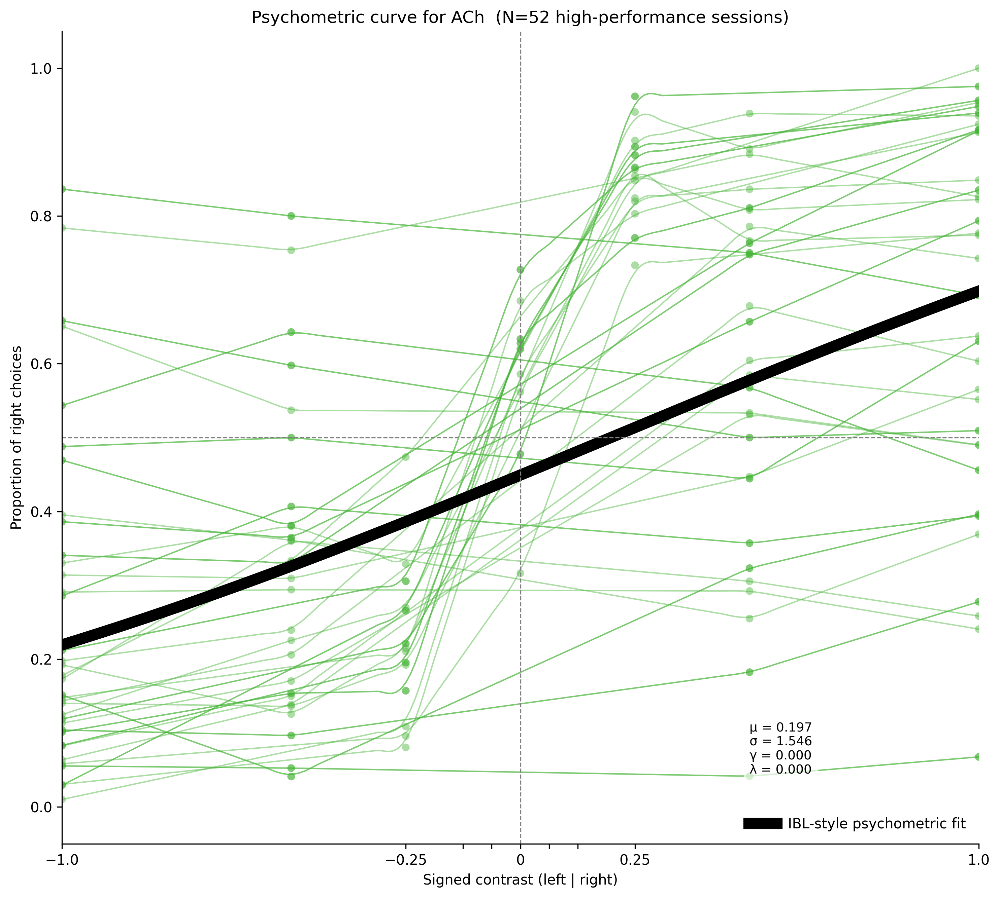

✅ Done — IBL-style psychometric fits saved in: /home/kceniabougrova/Documents/2025_10_31_POSTER_SfN/00_psychometric_SfN


In [29]:
# =========================================================
# MAIN LOOP PER NM
# =========================================================
for NM, subjects in MICE.items():
    color = PALETTE[NM]
    xgrid = np.linspace(-1, 1, 201)
    session_curves, session_dots = [], []
    sess_used = 0

    # ---- iterate sessions ----
    for _, row in df_high.iterrows():
        subject, date, region, eid = row["subject"], str(row["date"])[:10], str(row["region"]), str(row["eid"])
        if subject not in subjects:
            continue
        fpath = find_trials_file(BASE_DIR, subject, date, region, eid)
        if not fpath:
            continue
        df = pd.read_csv(fpath)
        xc, pc = session_prob_right_by_contrast(df)
        if xc.size < 2:
            continue
        y = interpolate_to_grid(xc, pc, xgrid)
        y = smooth_curve(y, window=13, poly=2)
        session_curves.append(y)
        session_dots.append((xc, pc))
        sess_used += 1

    if sess_used == 0:
        print(f"⚠️ No sessions for {NM}")
        continue

    session_curves = np.array(session_curves)
    mean_curve = np.nanmean(session_curves, axis=0)
    mean_curve = smooth_curve(mean_curve, window=25, poly=3)

    # ---- IBL-style fit to mean curve ----
    mu, sigma, gamma, lam = fit_psychometric(xgrid, mean_curve)
    yfit = psychometric_function(xgrid, mu, sigma, gamma, lam)
    print(f"✅ {NM}: μ={mu:.3f}, σ={sigma:.3f}, γ={gamma:.3f}, λ={lam:.3f}")

    # =========================================================
    # PLOT
    # =========================================================
    fig, ax = plt.subplots(figsize=(10, 9), dpi=300)

    # faded per-session lines
    for y in session_curves:
        ax.plot(xgrid, y, color=color, alpha=0.45, lw=1.0)

    # scatter dots per session
    for xc, pc in session_dots:
        ax.scatter(xc, pc, color=color, alpha=0.45, s=30, edgecolor="none")

    # thick IBL-style fit line
    ax.plot(xgrid, yfit, color="black", lw=8, label="IBL-style psychometric fit")

    # cosmetics — untouched from your version
    ax.axhline(0.5, color="gray", ls="--", lw=0.8)
    ax.axvline(0, color="gray", ls="--", lw=0.8)
    ax.set_xlim(-1, 1)
    ax.set_xticks([-1.0, -0.25, -0.125, -0.0625, 0, 0.0625, 0.125, 0.25, 1.0])
    ax.set_xticklabels(["−1.0", "−0.25", " ", " ", "0", " ", " ", "0.25", "1.0"])
    ax.set_ylim(-0.05, 1.05)
    ax.set_xlabel("Signed contrast (left | right)")
    ax.set_ylabel("Proportion of right choices")
    ax.set_title(f"Psychometric curve for {NM}  (N={sess_used} high-performance sessions)")
    ax.legend(frameon=False, loc="lower right")

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    # optional: add small parameter box like IBL figures
    txt = f"μ = {mu:.3f}\nσ = {sigma:.3f}\nγ = {gamma:.3f}\nλ = {lam:.3f}"
    ax.text(0.75, 0.15, txt, transform=ax.transAxes, fontsize=9, va="top",
            bbox=dict(facecolor="white", edgecolor="none", alpha=0.7))

    plt.tight_layout()
    # plt.savefig(os.path.join(OUT_DIR, f"psychometric_{NM}_IBLfit.png"), dpi=300)
    # plt.savefig(os.path.join(OUT_DIR, f"psychometric_{NM}_IBLfit.pdf"), dpi=300)
    plt.show()

print("✅ Done — IBL-style psychometric fits saved in:", OUT_DIR)

<ipython-input-31-d298a7df4479>:170: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False, loc="lower right")


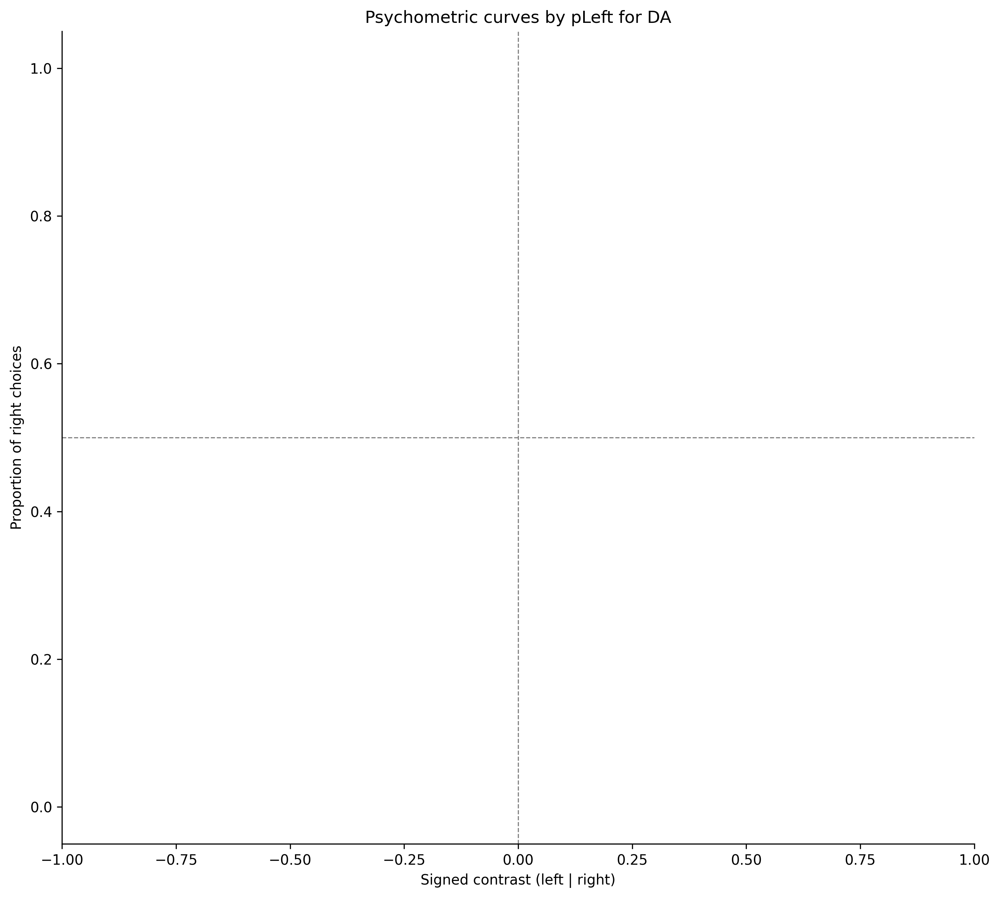

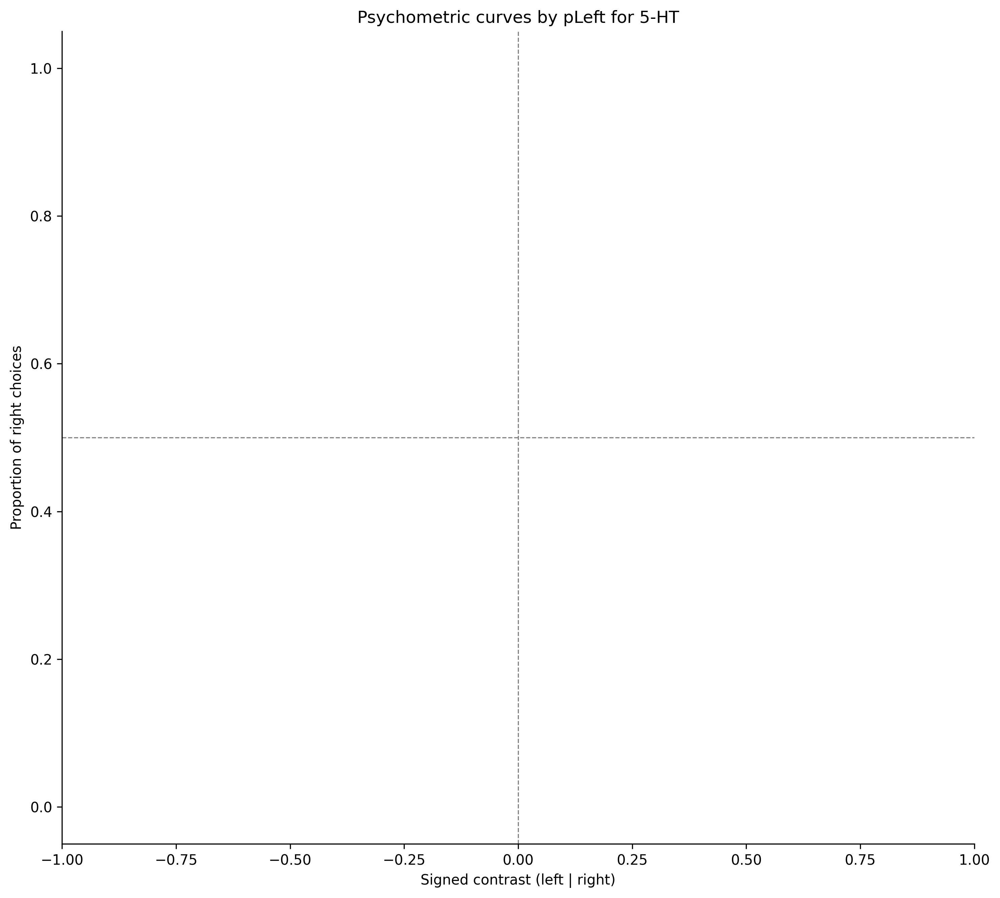

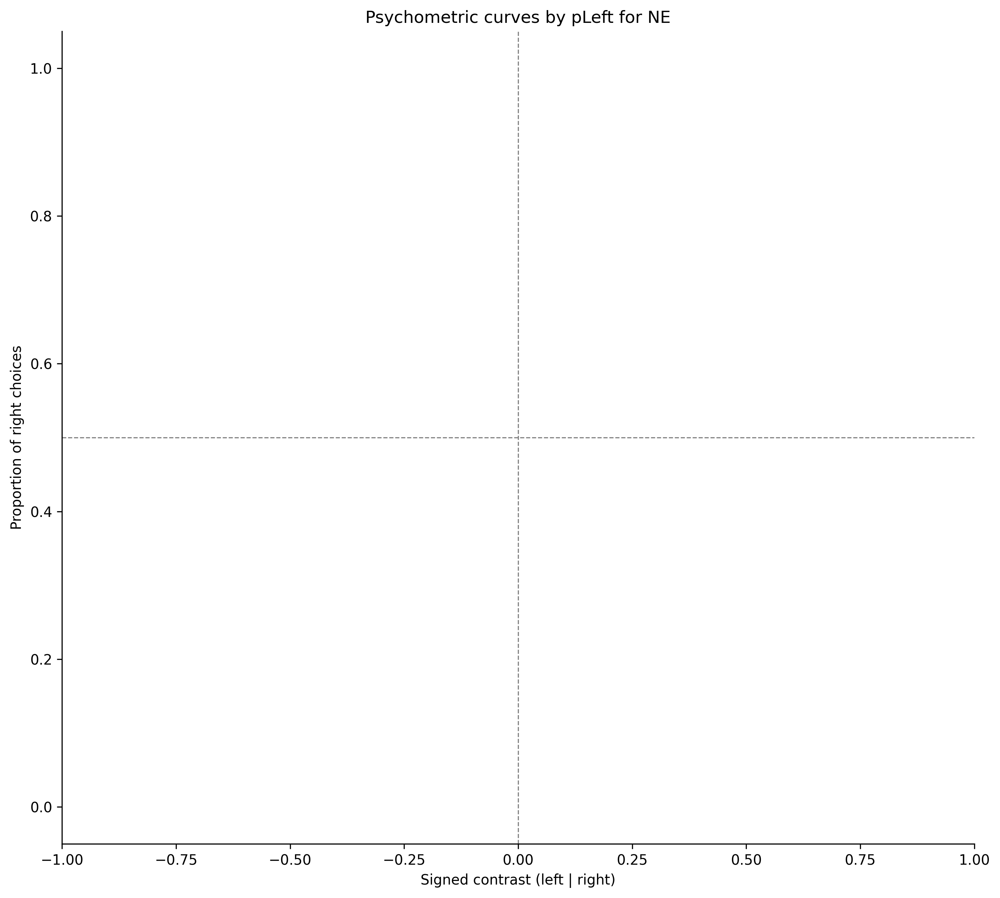

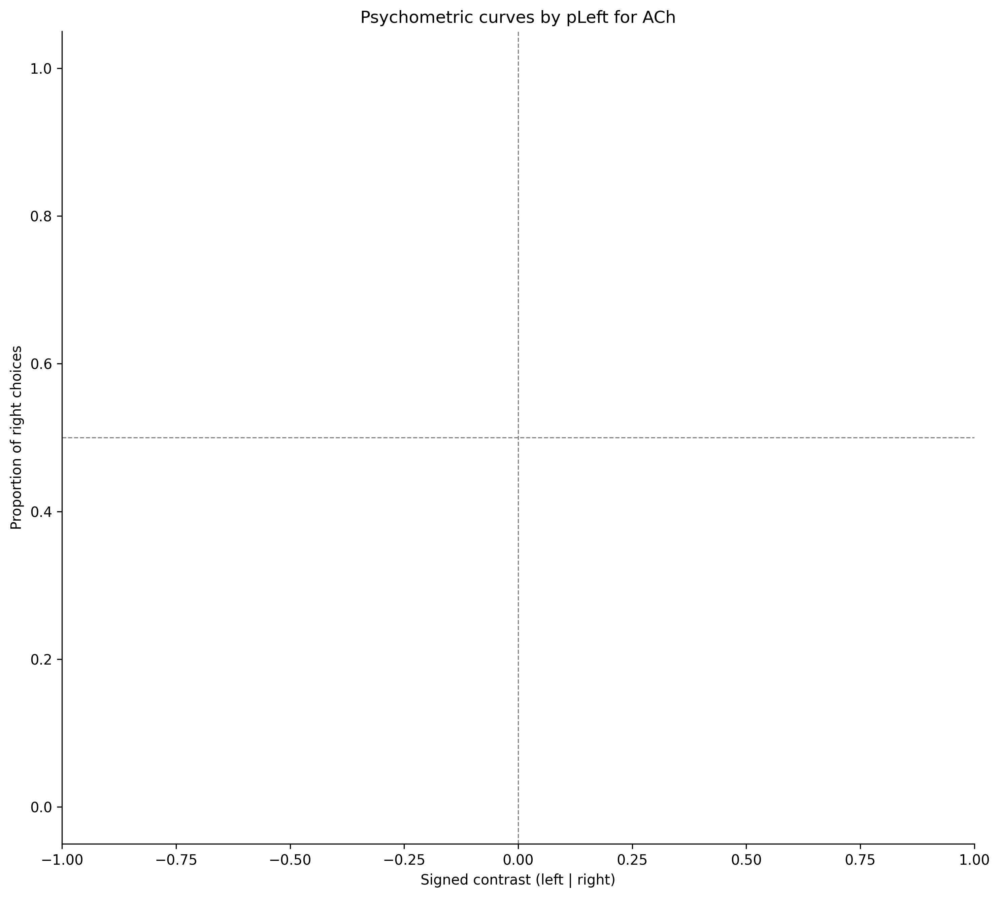

✅ Done — Average psychometric fits per probabilityLeft


In [31]:
# %%
# =========================================================
# =========================================================
# =========================================================
# Psychometric curves averaged by probabilityLeft, per NM
import os, numpy as np, pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
from scipy.stats import norm
from scipy.optimize import minimize

# =========================================================
# SETTINGS
# =========================================================

BASE_DIR = "/home/kceniabougrova/Downloads/good_sessions_outputs/"
df_path = os.path.join(BASE_DIR, "df_goodSessions_highPerf.xlsx")
df_high = pd.read_excel(df_path)

MICE = {
    "DA":   ["ZFM-03447","ZFM-03448","ZFM-03450","ZFM-04026","ZFM-04019","ZFM-04022"],
    "5-HT": ["ZFM-03061","ZFM-03065","ZFM-03059","ZFM-03062","ZFM-04392","ZFM-05236","ZFM-05248","ZFM-05245","ZFM-05235"],
    "NE":   ["ZFM-04533","ZFM-04534","ZFM-06271","ZFM-06272","ZFM-06171","ZFM-06268","ZFM-06275"],
    "ACh":  ["ZFM-06305","ZFM-06946","ZFM-06948"],
}

PALETTE = {
    "DA":   "#D44836",
    "5-HT": "#7F4CC8",
    "NE":   "#2E84CC",
    "ACh":  "#45B437",
}

PROBS = [0.2, 0.5, 0.8]
PROB_COLORS = {0.2: "#9EC9E2", 0.5: "#5278A3", 0.8: "#0F2C58"}

OUT_DIR = os.path.join(BASE_DIR, "psychometric_plots_highPerf_avgProb")
os.makedirs(OUT_DIR, exist_ok=True)

# =========================================================
# HELPER FUNCTIONS
# =========================================================
def find_trials_file(base_dir, subject, date, region, eid):
    for f in os.listdir(base_dir):
        if f.startswith("df_trials_") and subject in f and date in f and region in f and eid in f and f.endswith(".csv"):
            return os.path.join(base_dir, f)
    return None

def signed_contrast_x100(df):
    L = df["contrastLeft"].fillna(0).values
    R = df["contrastRight"].fillna(0).values
    return (R - L)

def stim_side(df):
    left_present  = df["contrastLeft"].notna().values
    right_present = df["contrastRight"].notna().values
    side = np.full(len(df), np.nan)
    side[(right_present) & (~left_present)] = +1
    side[(left_present) & (~right_present)] = -1
    return side

def session_prob_right_by_contrast(df):
    s = stim_side(df)
    fb = df["feedbackType"].values
    valid = (~np.isnan(s)) & np.isin(fb, [+1, -1])
    if not np.any(valid):
        return np.array([]), np.array([])
    sc = signed_contrast_x100(df)
    sc_v, s_v, fb_v = sc[valid], s[valid], fb[valid]
    chose_right = (fb_v * s_v) == +1
    xc = np.sort(np.unique(np.round(sc_v, 2)))
    pc = np.empty_like(xc, dtype=float)
    for i, c in enumerate(xc):
        m = np.isclose(sc_v, c, atol=1e-6)
        pc[i] = np.mean(chose_right[m]) if np.any(m) else np.nan
    return xc, pc

def interpolate_to_grid(xc, pc, xgrid):
    ok = ~np.isnan(pc)
    if np.sum(ok) < 2:
        return np.full_like(xgrid, np.nan)
    order = np.argsort(xc[ok])
    return np.interp(xgrid, xc[ok][order], pc[ok][order], left=np.nan, right=np.nan)

def smooth_curve(y, window=21, poly=3):
    y2 = y.copy()
    ok = ~np.isnan(y2)
    if np.sum(ok) < window:
        return y2
    y2[ok] = savgol_filter(y2[ok], window_length=window, polyorder=poly)
    return y2

def psychometric_function(x, mu, sigma, gamma, lam):
    return gamma + (1 - gamma - lam) * norm.cdf(x, loc=mu, scale=sigma)

def fit_psychometric(x, y):
    x, y = np.asarray(x), np.asarray(y)
    ok = ~np.isnan(y)
    if np.sum(ok) < 4:
        return (np.nan, np.nan, np.nan, np.nan)
    x, y = x[ok], y[ok]
    y = np.clip(y, 1e-4, 1 - 1e-4)
    def nll(params):
        mu, sigma, gamma, lam = params
        if sigma <= 0 or gamma < 0 or lam < 0 or gamma + lam >= 1:
            return np.inf
        p = psychometric_function(x, mu, sigma, gamma, lam)
        return -np.sum(y * np.log(p) + (1 - y) * np.log(1 - p))
    init   = [0, 0.3, 0.05, 0.05]
    bounds = [(-1, 1), (1e-3, 5), (0, 0.4), (0, 0.4)]
    res = minimize(nll, init, bounds=bounds)
    return res.x if res.success else (np.nan, np.nan, np.nan, np.nan)

# =========================================================
# MAIN LOOP PER NM
# =========================================================
for NM, subjects in MICE.items():
    color = PALETTE[NM]
    xgrid = np.linspace(-1, 1, 201)

    fig, ax = plt.subplots(figsize=(10, 9), dpi=300)
    sess_used = 0

    for pLeft in PROBS:
        curves = []
        for _, row in df_high.iterrows():
            subject, date, region, eid, p = (
                row["subject"],
                str(row["date"])[:10],
                str(row["region"]),
                str(row["eid"]),
                row.get("probabilityLeft", np.nan),
            )
            if subject not in subjects or not np.isclose(p, pLeft):
                continue
            fpath = find_trials_file(BASE_DIR, subject, date, region, eid)
            if not fpath:
                continue
            df = pd.read_csv(fpath)
            xc, pc = session_prob_right_by_contrast(df)
            if xc.size < 2:
                continue
            y = interpolate_to_grid(xc, pc, xgrid)
            y = smooth_curve(y, window=13, poly=2)
            curves.append(y)
            sess_used += 1

        if len(curves) == 0:
            continue

        mean_curve = np.nanmean(np.array(curves), axis=0)
        mean_curve = smooth_curve(mean_curve, window=25, poly=3)

        mu, sigma, gamma, lam = fit_psychometric(xgrid, mean_curve)
        yfit = psychometric_function(xgrid, mu, sigma, gamma, lam)

        ax.plot(
            xgrid, yfit, color=PROB_COLORS[pLeft], lw=3,
            label=f"pLeft={pLeft} (N={len(curves)})"
        )

    # cosmetics
    ax.axhline(0.5, color="gray", ls="--", lw=0.8)
    ax.axvline(0, color="gray", ls="--", lw=0.8)
    ax.set_xlim(-1, 1)
    ax.set_ylim(-0.05, 1.05)
    ax.set_xlabel("Signed contrast (left | right)")
    ax.set_ylabel("Proportion of right choices")
    ax.set_title(f"Psychometric curves by pLeft for {NM}")
    ax.legend(frameon=False, loc="lower right")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    plt.tight_layout()
    plt.show()

print("✅ Done — Average psychometric fits per probabilityLeft")


In [32]:
print(df_high.columns)
print(df_high["probabilityLeft"].unique())


Index(['Unnamed: 0', 'subject', 'date', 'good', 'detail', 'NM', 'eid', 'fiber',
       'region', 'nph_file', 'nph_bnc', 'comment', 'photometry_path_a',
       'photometry_path_b', 'digital_inputs_path', 'comment2', 'ttl nph',
       'ttl behav', 'Unnamed: 18', 'Unnamed: 19'],
      dtype='object')


KeyError: 'probabilityLeft'